# Importing Necessary Libraries

In [35]:
import os
import collections
import pandas as pd
import numpy as np
import functools
import matplotlib.pyplot as plt
import cv2

from sklearn import preprocessing 


import xml.etree.ElementTree as ET

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data import SequentialSampler

# Setting up the File Paths

In [36]:
BASE_PATH = "/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Train/"
XML_PATH = os.path.join(BASE_PATH, "Annotations")
IMG_PATH = os.path.join(BASE_PATH, "Images")
XML_FILES = [os.path.join(XML_PATH, f) for f in os.listdir(XML_PATH)]

# XML Parser

In [37]:
class XmlParser(object):

    def __init__(self,xml_file):

        self.xml_file = xml_file
        self._root = ET.parse(self.xml_file).getroot()
        self._objects = self._root.findall("object")
        # path to the image file as describe in the xml file
        self.img_path = os.path.join(IMG_PATH, self._root.find('filename').text)
        # image id 
        self.image_id = self._root.find("filename").text
        # names of the classes contained in the xml file
        self.names = self._get_names()
        # coordinates of the bounding boxes
        self.boxes = self._get_bndbox()

    def parse_xml(self):
        """"Parse the xml file returning the root."""
    
        tree = ET.parse(self.xml_file)
        return tree.getroot()

    def _get_names(self):

        names = []
        for obj in self._objects:
            name = obj.find("name")
            names.append(name.text)

        return np.array(names)

    def _get_bndbox(self):

        boxes = []
        for obj in self._objects:
            coordinates = []
            bndbox = obj.find("bndbox")
            coordinates.append(np.int32(bndbox.find("xmin").text))
            coordinates.append(np.int32(np.float32(bndbox.find("ymin").text)))
            coordinates.append(np.int32(bndbox.find("xmax").text))
            coordinates.append(np.int32(bndbox.find("ymax").text))
            boxes.append(coordinates)

        return np.array(boxes)

# Loading our Dataset Onto a Dataframe

In [39]:
def xml_files_to_df(xml_files):
    
    """"Return pandas dataframe from list of XML files."""
    
    names = []
    boxes = []
    image_id = []
    xml_path = []
    img_path = []
    for file in xml_files:
        xml = XmlParser(file)
        names.extend(xml.names)
        if(len(xml.names)==0):
            names.extend(["BG"])   #note that if no boxes are found on an image we add a background box to enable data storing in a df
            boxes.extend([[0,0,600,600]])  
            image_id.extend([xml.image_id])
            xml_path.extend([xml.xml_file])
            img_path.extend([xml.img_path])
            
        boxes.extend(xml.boxes)
        image_id.extend([xml.image_id] * len(xml.names))
        xml_path.extend([xml.xml_file] * len(xml.names))
        img_path.extend([xml.img_path] * len(xml.names))
    a = {"image_id": image_id,
         "names": names,
         "boxes": boxes,
         "xml_path":xml_path,
         "img_path":img_path}
    
    df = pd.DataFrame.from_dict(a, orient='index')
    df = df.transpose()
    
    return df

df = xml_files_to_df(XML_FILES)


In [40]:
df

,image_id,names,boxes,xml_path,img_path
0,India_007360.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
1,Japan_007915.jpg,D20,"[363, 249, 587, 541]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
2,Japan_007915.jpg,D20,"[32, 180, 235, 449]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
3,Japan_007915.jpg,D10,"[225, 370, 465, 415]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
4,India_006920.jpg,D40,"[459, 516, 487, 539]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
...,...,...,...,...,...
41169,Japan_012273.jpg,D43,"[175, 482, 599, 544]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41170,Japan_004793.jpg,D50,"[207, 362, 278, 379]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41171,Japan_005371.jpg,D20,"[67, 426, 230, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41172,Japan_005371.jpg,D20,"[229, 423, 427, 490]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...


In [41]:
df['names'].value_counts()

names
D20     8381
D00     6592
BG      6472
D40     5627
D44     5057
D10     4446
D50     3581
D43      793
D01      179
D11       45
D0w0       1
Name: count, dtype: int64

# Dataframe Cleaning and Fine Tuning

In [42]:
allowed_names = ['D00', 'D10', 'D20', 'D40','D44','D50','BG']

filtered_df = df[df['names'].isin(allowed_names)]

filtered_df

,image_id,names,boxes,xml_path,img_path
0,India_007360.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
1,Japan_007915.jpg,D20,"[363, 249, 587, 541]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
2,Japan_007915.jpg,D20,"[32, 180, 235, 449]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
3,Japan_007915.jpg,D10,"[225, 370, 465, 415]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
4,India_006920.jpg,D40,"[459, 516, 487, 539]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
...,...,...,...,...,...
41168,India_001539.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41170,Japan_004793.jpg,D50,"[207, 362, 278, 379]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41171,Japan_005371.jpg,D20,"[67, 426, 230, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41172,Japan_005371.jpg,D20,"[229, 423, 427, 490]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...


In [43]:
filtered_df = filtered_df.loc[filtered_df['image_id']!="Japan_001265.jpg"]
filtered_df

,image_id,names,boxes,xml_path,img_path
0,India_007360.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
1,Japan_007915.jpg,D20,"[363, 249, 587, 541]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
2,Japan_007915.jpg,D20,"[32, 180, 235, 449]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
3,Japan_007915.jpg,D10,"[225, 370, 465, 415]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
4,India_006920.jpg,D40,"[459, 516, 487, 539]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
...,...,...,...,...,...
41168,India_001539.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41170,Japan_004793.jpg,D50,"[207, 362, 278, 379]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41171,Japan_005371.jpg,D20,"[67, 426, 230, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...
41172,Japan_005371.jpg,D20,"[229, 423, 427, 490]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...


In [44]:
classes= {1:'D00',2:'D10',3:'D20',4:'D40',5:'D44',6:'D50',7:'BG'}

In [45]:
def map_label(name):
    for label, class_name in classes.items():
        if name == class_name:
            return label
    return None

# Add a new column 'label' based on the mapping
filtered_df['label'] = filtered_df['names'].apply(map_label)

filtered_df

/tmp/ipykernel_34/520637875.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['label'] = filtered_df['names'].apply(map_label)


,image_id,names,boxes,xml_path,img_path,label
0,India_007360.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,7
1,Japan_007915.jpg,D20,"[363, 249, 587, 541]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3
2,Japan_007915.jpg,D20,"[32, 180, 235, 449]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3
3,Japan_007915.jpg,D10,"[225, 370, 465, 415]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,2
4,India_006920.jpg,D40,"[459, 516, 487, 539]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,4
...,...,...,...,...,...,...
41168,India_001539.jpg,BG,"[0, 0, 600, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,7
41170,Japan_004793.jpg,D50,"[207, 362, 278, 379]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,6
41171,Japan_005371.jpg,D20,"[67, 426, 230, 600]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3
41172,Japan_005371.jpg,D20,"[229, 423, 427, 490]",/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3


In [46]:
filtered_df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(filtered_df['boxes'].tolist(), index=filtered_df.index)

# Drop the original 'boxes' column
filtered_df.drop(columns=['boxes'], inplace=True)

filtered_df

/tmp/ipykernel_34/2420950881.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(filtered_df['boxes'].tolist(), index=filtered_df.index)
/tmp/ipykernel_34/2420950881.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df[['xmin', 'ymin', 'xmax', 'ymax']] = pd.DataFrame(filtered_df['boxes'].tolist(), index=filtered_df.index)
/tmp/ipykernel_34/2420950881.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

,image_id,names,xml_path,img_path,label,xmin,ymin,xmax,ymax
0,India_007360.jpg,BG,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,7,0,0,600,600
1,Japan_007915.jpg,D20,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3,363,249,587,541
2,Japan_007915.jpg,D20,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3,32,180,235,449
3,Japan_007915.jpg,D10,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,2,225,370,465,415
4,India_006920.jpg,D40,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,4,459,516,487,539
...,...,...,...,...,...,...,...,...,...
41168,India_001539.jpg,BG,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,7,0,0,600,600
41170,Japan_004793.jpg,D50,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,6,207,362,278,379
41171,Japan_005371.jpg,D20,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3,67,426,230,600
41172,Japan_005371.jpg,D20,/kaggle/input/road-images-dataset-for-road-fau...,/kaggle/input/road-images-dataset-for-road-fau...,3,229,423,427,490


In [47]:
filtered_df.drop(columns=['names'], inplace=True)

/tmp/ipykernel_34/1131615130.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.drop(columns=['names'], inplace=True)


In [48]:
boxes = filtered_df[['xmin', 'ymin', 'xmax', 'ymax']].values
boxes

array([[  0,   0, 600, 600],
       [363, 249, 587, 541],
       [ 32, 180, 235, 449],
       ...,
       [ 67, 426, 230, 600],
       [229, 423, 427, 490],
       [  0,   0, 600, 600]])

# Splitting the Dataset into Training and Validation Sets

In [49]:
image_ids = df['image_id'].unique()
valid_ids = image_ids[-3000:]
train_ids = image_ids[:-3000]
print(len(train_ids))

18041


In [50]:
valid_df = filtered_df[filtered_df['image_id'].isin(valid_ids)]
train_df = filtered_df[filtered_df['image_id'].isin(train_ids)]
valid_df.shape, train_df.shape

((5647, 8), (34505, 8))

# Custom Dataset Loader and it's Visualisation

In [51]:
class VOCDataset(Dataset):
    
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()
        
        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
    
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        records = self.df[self.df['image_id'] == image_id]
        
        image = cv2.imread(f'{self.image_dir}/{image_id}', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        rows, cols = image.shape[:2]
        
        boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values
        
       
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = torch.as_tensor(area, dtype=torch.float32)
        
        label = records['label'].values
        labels = torch.as_tensor(label, dtype=torch.int64)
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        # target['masks'] = None
        target['image_id'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd
        
        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1,0)
            
            return image, target
        
    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [52]:
def get_transform_train():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0)
    ], bbox_params={'format':'pascal_voc', 'label_fields': ['labels']})

def get_transform_valid():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields':['labels']})

In [53]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = VOCDataset(train_df, IMG_PATH , get_transform_train())
valid_dataset = VOCDataset(valid_df, IMG_PATH, get_transform_valid())


# split the dataset in train and test set
indices = torch.randperm(len(train_dataset)).tolist()


train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    collate_fn=collate_fn
)

In [54]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

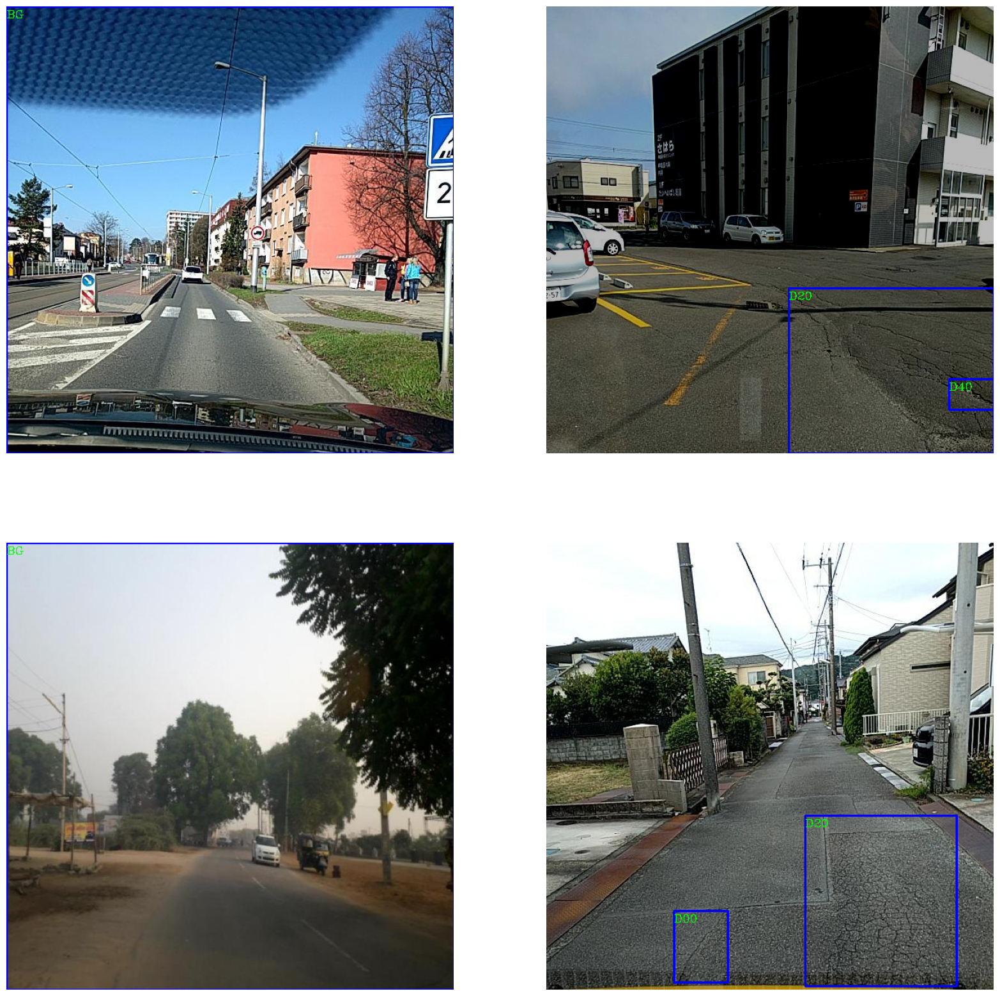

In [55]:
images, targets= next(iter(train_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

plt.figure(figsize=(20,20))
for i, (image, target) in enumerate(zip(images, targets)):
    plt.subplot(2,2, i+1)
    boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
    sample = images[i].permute(1,2,0).cpu().numpy()
    names = targets[i]['labels'].cpu().numpy().astype(np.int64)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 0, 220), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]+15),cv2.FONT_HERSHEY_COMPLEX ,0.5,(0,220,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)

# Model Declaration and Training

In [56]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [57]:
num_classes = 8

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [58]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

In [59]:
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-at5dzi8s
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-at5dzi8s
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done


In [60]:
!git clone https://github.com/pytorch/vision.git
!cd vision;cp references/detection/utils.py ../;cp references/detection/transforms.py ../;cp references/detection/coco_eval.py ../;cp references/detection/engine.py ../;cp references/detection/coco_utils.py ../

fatal: destination path 'vision' already exists and is not an empty directory.


In [61]:
from engine import train_one_epoch, evaluate
import utils

In [62]:
WEIGHTS_FILE = "/kaggle/input/road-images-dataset-for-road-fault-detection/faster_rcnn_state.pth"


# Load the traines weights
model.load_state_dict(torch.load(WEIGHTS_FILE))

<All keys matched successfully>

In [63]:
num_epochs = 1

for epoch in range(num_epochs):
    #train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=5)
    
    lr_scheduler.step()
    

Epoch: [0]  [   0/4432]  eta: 0:51:44  lr: 0.000010  loss: 0.2699 (0.2699)  loss_classifier: 0.0916 (0.0916)  loss_box_reg: 0.1182 (0.1182)  loss_objectness: 0.0185 (0.0185)  loss_rpn_box_reg: 0.0416 (0.0416)  time: 0.7005  data: 0.2725  max mem: 3383
Epoch: [0]  [   5/4432]  eta: 0:34:33  lr: 0.000035  loss: 0.2333 (0.2619)  loss_classifier: 0.0950 (0.1105)  loss_box_reg: 0.0776 (0.0967)  loss_objectness: 0.0185 (0.0294)  loss_rpn_box_reg: 0.0096 (0.0253)  time: 0.4684  data: 0.0570  max mem: 3385
Epoch: [0]  [  10/4432]  eta: 0:32:51  lr: 0.000060  loss: 0.2333 (0.2376)  loss_classifier: 0.1005 (0.1011)  loss_box_reg: 0.0959 (0.0941)  loss_objectness: 0.0160 (0.0237)  loss_rpn_box_reg: 0.0071 (0.0186)  time: 0.4458  data: 0.0371  max mem: 3385
Epoch: [0]  [  15/4432]  eta: 0:32:15  lr: 0.000085  loss: 0.2132 (0.2162)  loss_classifier: 0.0916 (0.0900)  loss_box_reg: 0.0762 (0.0898)  loss_objectness: 0.0123 (0.0188)  loss_rpn_box_reg: 0.0067 (0.0177)  time: 0.4382  data: 0.0301  max me

In [64]:
torch.save(model.state_dict(), '/kaggle/working/faster_rcnn_state3.pth')

# Loading the Saved Checkpoints and Running on Test Data

In [65]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

WEIGHTS_FILE = "/kaggle/working/faster_rcnn_state3.pth"

num_classes = 8 

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load the traines weights
model.load_state_dict(torch.load(WEIGHTS_FILE))

model = model.to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=None`.
  warnings.warn(msg)


In [72]:
def obj_detector(img):
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)


    img /= 255.0
    img = torch.from_numpy(img)
    img = img.unsqueeze(0)
    img = img.permute(0,3,1,2)
    
    model.eval()

    detection_threshold = 0.65
    
    img = list(im.to(device) for im in img)
    output = model(img)

    for i , im in enumerate(img):
        boxes = output[i]['boxes'].data.cpu().numpy()
        scores = output[i]['scores'].data.cpu().numpy()
        labels = output[i]['labels'].data.cpu().numpy()

        labels = labels[scores >= detection_threshold]
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        scores = scores[scores >= detection_threshold]

        boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
        boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    
    sample = img[0].permute(1,2,0).cpu().numpy()
    sample = np.array(sample)
    boxes = output[0]['boxes'].data.cpu().numpy()
    name = output[0]['labels'].data.cpu().numpy()
    scores = output[0]['scores'].data.cpu().numpy()
    
    boxes = boxes[scores >= detection_threshold].astype(np.int32)
    names = name.tolist()
    
    return names, boxes, sample

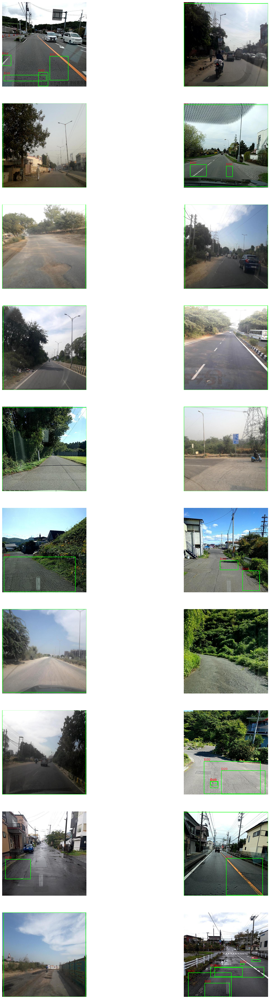

In [73]:
pred_path = "/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Test/Images/" 
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))
for i, images in enumerate(pred_files):
    if i > 19:break
    plt.subplot(10,2,i+1)
    names,boxes,sample = obj_detector(images)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)
#     plt.savefig('save_image.png', bbox_inches='tight')  # if you want to save result

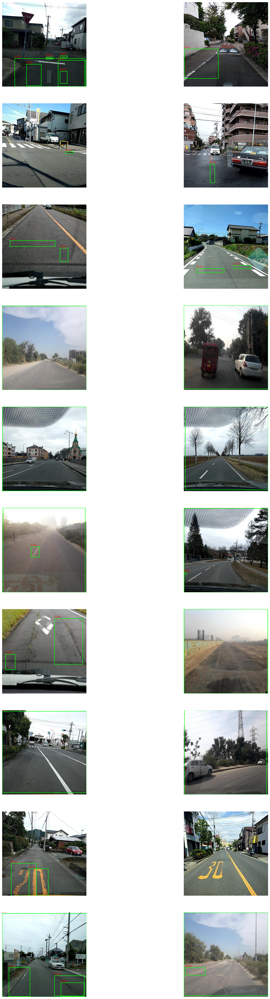

In [74]:
pred_path = "/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Test/Images/"
pred_files = [os.path.join(pred_path,f) for f in os.listdir(pred_path)]

plt.figure(figsize=(20,60))
for i, images in enumerate(pred_files):
    if i<39:continue
    if i>58:break    
    plt.subplot(10,2,i+1-39)
    names,boxes,sample = obj_detector(images)
    for i,box in enumerate(boxes):
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 220, 0), 2)
        cv2.putText(sample, classes[names[i]], (box[0],box[1]-5),cv2.FONT_HERSHEY_COMPLEX ,0.7,(220,0,0),1,cv2.LINE_AA)  

    plt.axis('off')
    plt.imshow(sample)
#     plt.savefig('save_image.png', bbox_inches='tight')  # if you want to save result

# Intersection over Union Metrics on Validation Set

In [75]:
def calculate_iou(box1, box2):
   
    intersection_x1 = max(box1[0], box2[0])
    intersection_y1 = max(box1[1], box2[1])
    intersection_x2 = min(box1[2], box2[2])
    intersection_y2 = min(box1[3], box2[3])

    intersection_area = max(0, intersection_x2 - intersection_x1 + 1) * max(0, intersection_y2 - intersection_y1 + 1)

    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    iou = intersection_area / float(box1_area + box2_area - intersection_area)

    return iou



iou_dict = {label: [] for label in valid_df['label'].unique()}

for image_id in valid_ids:
    image_boxes = valid_df[valid_df['image_id'] == image_id]
    img_path = '/kaggle/input/road-images-dataset-for-road-fault-detection/DATASET/DATASET/Train/Images/' + image_id
    img = plt.imread(img_path).astype(np.float32) / 255.0
    img = torch.from_numpy(img)
    img = img.unsqueeze(0)
    img = img.permute(0, 3, 1, 2)

    model.eval()
    with torch.no_grad():
        output = model(img.to(device))

    for i, pred_box in enumerate(output[0]['boxes'].data.cpu().numpy()):
        label = output[0]['labels'].data.cpu().numpy()[i]

       
        actual_boxes = image_boxes[image_boxes['label'] == label][['xmin', 'ymin', 'xmax', 'ymax']].values

        if len(actual_boxes) > 0:
            ious = [calculate_iou(pred_box, actual_box) for actual_box in actual_boxes]
            max_iou = max(ious, default=0.0)
            iou_dict[label].append(max_iou)


for label, iou_values in iou_dict.items():
    mean_iou = sum(iou_values) / len(iou_values) if len(iou_values) > 0 else 0.0
    print(f"Label {label} - Mean IoU: {mean_iou}")

Label 7 - Mean IoU: 0.9765007913964042
Label 1 - Mean IoU: 0.2652716288098964
Label 4 - Mean IoU: 0.25527421868928
Label 6 - Mean IoU: 0.38309695401500105
Label 3 - Mean IoU: 0.32973559672511565
Label 2 - Mean IoU: 0.28445347927665116
Label 5 - Mean IoU: 0.3507178343430541
